# Bank Marketing Campaign

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from scipy.stats import uniform, randint
import joblib

from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold,RandomizedSearchCV

from sklearn.pipeline import Pipeline
from category_encoders import BinaryEncoder
from sklearn.preprocessing import OneHotEncoder,LabelEncoder

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier

from sklearn.metrics import confusion_matrix, f1_score

# A. Business Understanding

**Context**

Banks rely on gathering deposits from customers as a primary source of funding for their operations. By collecting money from customers through deposit products like term deposits, banks can utilize these funds to provide loans and other financial services to individuals and businesses. This process enables banks to generate revenue through interest earned on loans, thereby facilitating economic growth and development within the community. Therefore, attracting and retaining customers through deposit accounts is crucial for banks to maintain liquidity and sustain their lending activities. This underscores the significance of understanding customer behavior and preferences to effectively tailor marketing efforts and encourage deposit account openings.

**Problem Statement**

In the competitive financial industry, banks strive to acquire new customers and retain existing ones, a process that demands significant time, financial investment, and other resources. One of the key challenges lies in identifying potential customers who are likely to open term deposit accounts in response to marketing campaigns. Precisely predicting this behavior enables banks to efficiently optimize campaign targeting and allocate resources effectively.

**Analytic Approach**

A machine learning algorithm will be developed to address the aforementioned issue by predicting potential customers who are likely to opt for opening a term deposit and those who are not. This predictive model will be constructed using customer demographics, transaction history, and campaign interaction data. Multiple classification algorithms including decision trees, random forests, Light GBM, CatBoost, and XGBoost will be employed to construct predictive models. These models aim to determine the probability of a customer opening a term deposit account based on their attributes and campaign engagements.

**Metric Evaluation**

Evaluation metrics that suitable for this project is F1-score. It strikes a balance between precision and recall, providing a thorough evaluation of the model's effectiveness in predicting whether a customer will choose to open a deposit account or not.

# B. Data Understanding

Data understanding is conducted to ensure a comprehensive grasp of the dataset before proceeding with any analysis or modeling tasks. This phase involves:
- Gaining insights into the structure, content, and quality of the dataset.
- Examining data types, variable names, and descriptions.

**1. Import data**

In [2]:
data=pd.read_csv("D:\\data science project\\Purwadhika\\Codes\\Modul 3\\data_bank_marketing_campaign.csv")

**2. Data Dimension and Feature**

In [3]:
display(data.shape)
display(data.info())
data.head()

(7813, 11)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7813 entries, 0 to 7812
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   age       7813 non-null   int64 
 1   job       7813 non-null   object
 2   balance   7813 non-null   int64 
 3   housing   7813 non-null   object
 4   loan      7813 non-null   object
 5   contact   7813 non-null   object
 6   month     7813 non-null   object
 7   campaign  7813 non-null   int64 
 8   pdays     7813 non-null   int64 
 9   poutcome  7813 non-null   object
 10  deposit   7813 non-null   object
dtypes: int64(4), object(7)
memory usage: 671.6+ KB


None

,age,job,balance,housing,loan,contact,month,campaign,pdays,poutcome,deposit
0,55,admin.,1662,no,no,cellular,jun,2,-1,unknown,yes
1,39,self-employed,-3058,yes,yes,cellular,apr,3,-1,unknown,yes
2,51,admin.,3025,no,no,cellular,may,1,352,other,yes
3,38,services,-87,yes,no,cellular,may,1,-1,unknown,no
4,36,housemaid,205,yes,no,telephone,nov,4,-1,unknown,no


The dataset being used in this project have 7813 rows and 11 Columns. Here's a brief description of each column:

| Feature   | Type      | Description                                                                 |
|-----------|-----------|-----------------------------------------------------------------------------|
| age       | Integer   | Represents the age of the customer.                                         |
| job       | Object    | Indicates the occupation or job type of the customer.                       |
| balance   | Integer   | Represents the account balance of the customer.                             |
| housing   | Object    | Indicates whether the customer has a housing loan.                          |
| loan      | Object    | Indicates whether the customer has a personal loan.                         |
| contact   | Object    | Represents the method of communication with the customer.                   |
| month     | Object    | Indicates the last contact month of the year.                               |
| campaign  | Integer   | Represents the number of contacts performed during this campaign.           |
| pdays     | Integer   | Represents the number of days passed after the client was last contacted.   |
| poutcome  | Object    | Indicates the outcome of the previous marketing campaign.                   |
| deposit   | Object    | Indicates whether the customer opened a term deposit account.               |


The dataset contains 6 categorical feature and 4 numerical feature. The dataset's rown represents customer's demographics, contact history, and financial status. the target feature in this project is feature 'deposit' which contain information about customer's decision to opened a term deposit account or not.

In [4]:
data.rename({"deposit":"Class"},axis=1,inplace=True)

the target feature deposit was renamed into class to prevent us from mistakenly choosinng target feature in this analysis

# C. Data Exploration

Data exploration is a crucial step in the data analysis process where analysts or data scientists examine and investigate data to understand its characteristics, patterns, and relationships. This exploration is typically performed before applying any formal statistical techniques or building predictive models. In This project The data exploration that will be done are :

- Duplicate Rows.
- Missing Value.
- Univariate Analysis.
- Class Distribution (Target Variable).
- Bivariate Analysis.


**1. Duplicate rows**

Detecting and managing duplicate rows is crucial as they can distort analysis results and lead to incorrect conclusions. These duplicates may arise due to data entry errors, system glitches, or other issues, and if left unaddressed, they can bias statistical analyses and modeling efforts. Therefore, identifying and removing duplicate rows is essential to ensure the accuracy and reliability of subsequent analyses and modeling tasks.

In [5]:
print (f" duplicated rows {data.duplicated().sum()}")
data=data.drop_duplicates()
print (f" duplicated rows {data.duplicated().sum()}")

 duplicated rows 8
 duplicated rows 0


**2. Missing Values**

Addressing missing values is urgent as they can significantly impact the validity of data analysis and modeling outcomes. Missing values can introduce bias, reduce statistical power, and affect the performance of predictive models. Failure to handle missing values appropriately can lead to erroneous conclusions and flawed decision-making. Therefore, it is crucial to identify and address missing values through imputation or deletion to maintain data integrity and ensure the reliability of analytical results.

In [6]:
missing=(data.isnull().sum()/len(data)*100).reset_index().sort_values(by=0,ascending=False)
missing.rename({"index":"column",0:"percentage"},axis=1,inplace=True)
missing

,column,percentage
0,age,0.0
1,job,0.0
2,balance,0.0
3,housing,0.0
4,loan,0.0
5,contact,0.0
6,month,0.0
7,campaign,0.0
8,pdays,0.0
9,poutcome,0.0


In [7]:
data.rename({"deposit":"Class"},axis=1,inplace=True)

**3. Univariate Analysis**

Conducting univariate analysis is essential to gain insights into the distribution and characteristics of individual variables within the dataset. Understanding the central tendency, spread, and distribution of variables is crucial for identifying outliers, assessing data quality, and detecting potential patterns or anomalies.

In [8]:
data.describe(include="all")

,age,job,balance,housing,loan,contact,month,campaign,pdays,poutcome,Class
count,7805.000000,7805,7805.000000,7805,7805,7805,7805,7805.000000,7805.000000,7805,7805
unique,NaN,12,NaN,2,2,3,12,NaN,NaN,4,2
top,NaN,management,NaN,no,no,cellular,may,NaN,NaN,unknown,no
freq,NaN,1789,NaN,4136,6781,5623,1973,NaN,NaN,5811,4075
mean,41.257783,NaN,1513.968225,NaN,NaN,NaN,NaN,2.520564,51.462268,NaN,NaN
std,11.922833,NaN,3090.508938,NaN,NaN,NaN,NaN,2.728204,108.115084,NaN,NaN
min,18.000000,NaN,-6847.000000,NaN,NaN,NaN,NaN,1.000000,-1.000000,NaN,NaN
25%,32.000000,NaN,128.000000,NaN,NaN,NaN,NaN,1.000000,-1.000000,NaN,NaN
50%,39.000000,NaN,550.000000,NaN,NaN,NaN,NaN,2.000000,-1.000000,NaN,NaN
75%,49.000000,NaN,1685.000000,NaN,NaN,NaN,NaN,3.000000,41.000000,NaN,NaN


- **age:** The distribution of ages shows that the customers' ages range from 18 to 95 years, with a mean age of approximately 41.26 years. The standard deviation is approximately 11.92, indicating some variability around the mean. The median age (50th percentile) is 39 years, indicating that half of the customers are younger than this age, and half are older.

- **job:** This feature has 12 unique values, with "management" being the most frequent job type, occurring 1792 times in the dataset.

- **balance:** The account balance ranges from -6847 to 66653, indicating a wide range of financial statuses among customers. The mean balance is approximately 1512.45, with a standard deviation of approximately 3089.29, suggesting significant variability in account balances. the negative value of balance occured when its loan is higher than saving.

- **housing:** This column has 2 unique values no and yes which indicates whether a customer has housing loan or not. The majority of customers (4140 out of 7813) do not have a housing loan, as indicated by the "no" category, which is the most frequent.

- **loan:** Similar to the "housing" column, this column has unique values yes and no that indicates whether the customer has a personal loan or not. The majority of customers (6789 out of 7813) do not have a personal loan, as indicated by the "no" category, which is the most frequent.

- **contact:** This categorical column represents the method of communication with the customer and has 3 unique values. The most frequent contact method is "cellular," occurring 5628 times in the dataset.

- **month:** This categorical column indicates the last contact month of the year and has 12 unique values. The most common contact month is "may," occurring 1976 times in the dataset.

- **campaign:** The distribution of the number of contacts performed during this campaign for each customer ranges from 1 to 63. The mean number of contacts is approximately 2.52, with a standard deviation of approximately 2.73, indicating some variability in the campaign interaction frequency among customers. the contacting number above 3 are not dropped to prevent the model being too specific.

- **pdays:** This numerical column represents the number of days passed after the client was last contacted from a previous campaign. The distribution ranges from -1 to 854, with a mean of approximately 51.41 days. The standard deviation is approximately 108.07 days, indicating variability in the duration since customer engagement from the previous campaign. the pdays -1 means that the customer hasn't been contacted yet.

- **poutcome:** This categorical column indicates the outcome of the previous marketing campaign and have 4 unique values. The most frequent values is "unknown," occurring 5819 times in the dataset.

- **Class:** This categorical column were orginally named deposit and has value yes and no that indicates whether the customer opened a term deposit account or not. The majority of customers (4081 out of 7813) did not open a term deposit account, as indicated by the "no" category, which is the most frequent.


**4. Class Distribution**

Exploring the class distribution of the target variable is urgent. Class imbalance can lead to biased model predictions, where the minority class is often underrepresented and overshadowed by the majority class. 

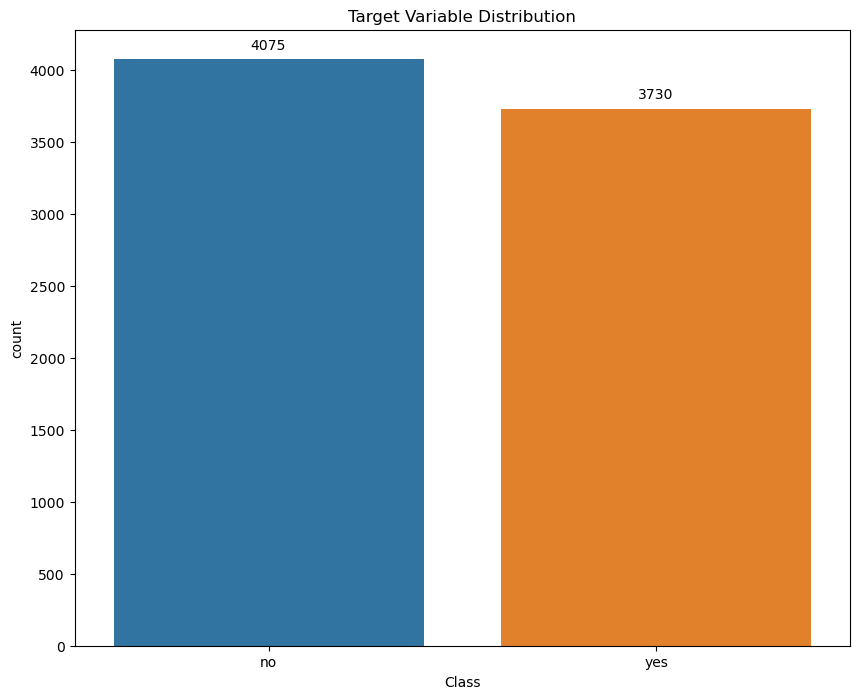

In [9]:
fig, ax = plt.subplots(figsize=(10, 8))

bar=data[["Class"]].value_counts().reset_index()
sns.barplot(data=bar, x="Class", y="count", ax=ax)
ax.set_title('Target Variable Distribution')
ax.set_ylabel("count")
for p in ax.patches:
    ax.annotate(int(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', xytext=(0, 10), textcoords='offset points')

The visualization of the target feature in this dataset indicates that there is no significant imbalance issue. Therefore, there is no need to employ resampling methods as the dataset exhibits a relatively balanced distribution between the majority and minority classes.

**5. Bivariate Analysis**

Performing bivariate analysis is critical for uncovering relationships and dependencies between pairs of variables within the dataset. In this preoject, the bivariate analysis is performed to uncover the association between dependent and independent features.

**a. Categorical Feature Distribution of Each Class**

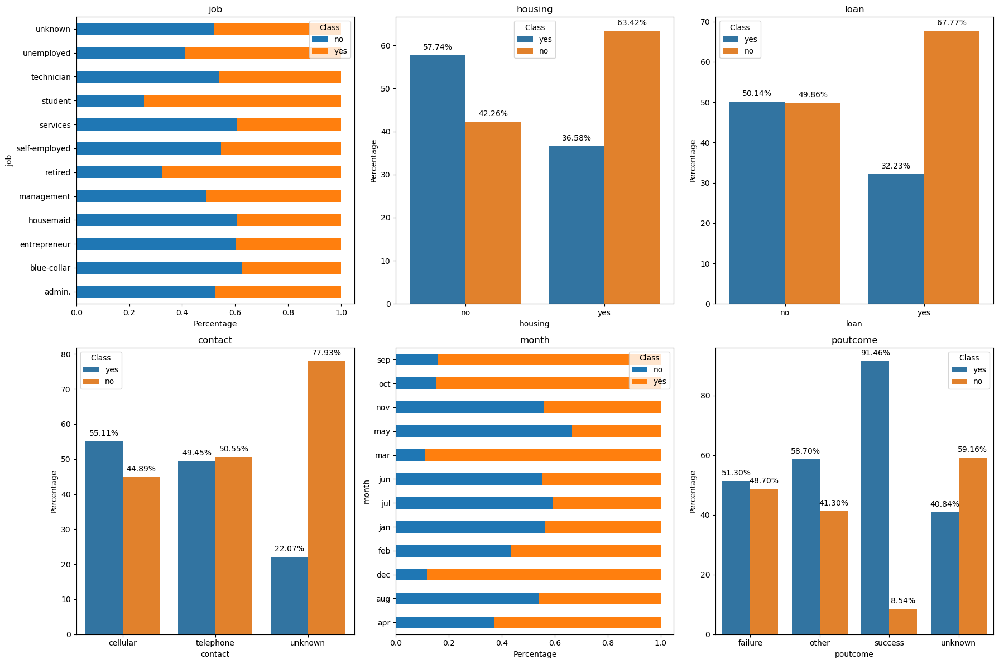

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

num_cols = 3  
num_plots = len(data.select_dtypes(exclude='number').columns) - 1 

num_rows = (num_plots + num_cols - 1) // num_cols  

fig, ax = plt.subplots(num_rows, num_cols, figsize=(18, 12))
ax = ax.ravel() 

for i, col in enumerate(data.select_dtypes(exclude='number').columns):
    if col != "Class":
        categories = data[col].nunique()
        if categories <= 4:
            bar = data.groupby(col)["Class"].value_counts(normalize=True).reset_index()
            bar['percentage'] = bar['proportion'] * 100  

            sns.barplot(data=bar, x=col, y="percentage", hue="Class", ax=ax[i])
            ax[i].set_title(col)
            ax[i].set_ylabel("Percentage")

            for p in ax[i].patches:
                ax[i].annotate(f"{p.get_height():.2f}%", (p.get_x() + p.get_width() / 2., p.get_height()),
                               ha='center', va='center', xytext=(0, 10), textcoords='offset points')
        else:
            bar = data.groupby(col)["Class"].value_counts(normalize=True).unstack()
            bar.plot(kind='barh', stacked=True, ax=ax[i])
            ax[i].set_title(col)
            ax[i].set_xlabel("Percentage")

plt.tight_layout()
plt.show()


- **job:** The distribution of value in this feauture are varied, the most notable value is customers with job student and reitred as the visualization suggest that majority of student and retired's person tend to for opening term deposit.

- **housing:** The visualization suggest that customers with a housing loan are less likely to opt for opening a term deposit account, while those without a housing loan are more inclined to do so.

- **loan:** From the barplot above, it can be seen that customers with a loan are less likely to opt for opening a term deposit account. For customers without a personal loan, the likelihood of opting for opening a term deposit account is evenly split, with approximately a 50/50 distribution.

- **contact:** We can see from the visualization aboove that customer's with unknown contacting type are more likely to opt for opening term deposit, while the other types doesn't show significant tendency for customer to opt for opening deposit or not.

- **month:** The visualization suggest that customer's last contacted on march, september, october, november, and december more inclined to opt for opening term deposit.

- **poutcome:** It can be seen that customer's whose previous campaign outcome is success are more likely to opt for opening term deposit.

**b. Numerical Feature Distribution of Each Class**

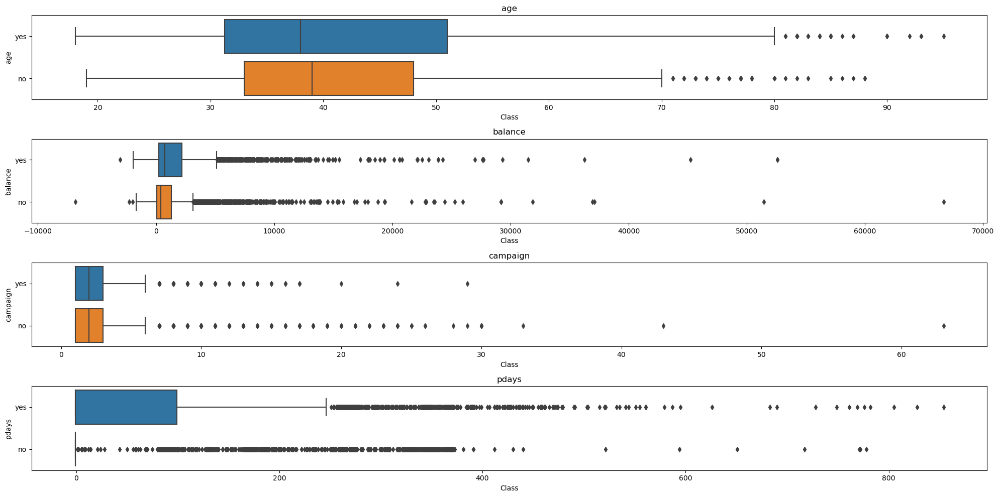

In [12]:
numeric_columns = data.select_dtypes(include='number').columns

fig, ax = plt.subplots(len(numeric_columns), 1, figsize=(20, 10))
for i, col in enumerate(numeric_columns):
    sns.boxplot(data=data, x=col, y='Class', ax=ax[i],orient="h")
    ax[i].set_title(col)
    ax[i].set_ylabel(col)
    ax[i].set_xlabel('Class')

plt.tight_layout()
plt.savefig('a')
plt.show()

- **age:** The age distributions in both groups are dissimilar. It appears that individuals in both the younger and older age brackets tend to opt for term deposits. Younger individuals may be saving for long-term goals such as buying a house or retirement, while older individuals may be looking for secure investment options to protect their savings in retirement.

- **balance:** The dissimilarity in account balance distributions suggests that individuals with higher balances tend to opt for deposits. This trend may be attributed to the greater financial stability typically associated with higher account balances.

- **campaign:** The similarity in the number of contacts performed during this campaign for each customer from both groups suggests that the feature itself doesn't have a direct effect on the customer's decision to opt for a deposit. However, the feature might be used when combined with other variables, and hence will be considered in this project.

- **pdays:** The dissimilarity in the distribution of 'pdays,' which represents the number of days passed after the client was last contacted from a previous campaign, indicates variability in the duration since customer engagement from the previous campaign between the two groups. Notably, customers with a 'pdays' value of 0 tend to not deposit, suggesting that recent contact attempts may not be conducive to deposit uptake.


The Data Exploration that has been conducted shows that the only problem on the dataset is duplicate values which has been drop immidietly. The dataset contains several extreme values but they are not dropped so that the model will be more general.

# D. Data Preprocessing 


Data preprocessing is done because the model that created only as good as the data that used to create it. In this project, the data processing that conducted are:

- Encoding Categorical Feature into Numeric.
- Spltting the data into train and test.

**1. Encoding**

Encoding categorical feature is important because model cannot proccess string value. The string value needs to be transformed into numeric. The preprocessing below is applied on pipelines in order to prevent data leakage. Transformation of the target variable into numeric is done before splitting for the sake of efficiency and won't cause data leakage for it only transform 'yes' into value 1 and 'no' into zero.

In [13]:
label_encoder = LabelEncoder()
data["Class"] = label_encoder.fit_transform(data["Class"])

In [14]:
onehot=["housing","loan"]
binarycode=["poutcome",'month','job',"contact"]

preprocessor = ColumnTransformer([
    ('onehot', OneHotEncoder(), onehot),
    ('binary', BinaryEncoder(), binarycode),
], remainder='passthrough')

**2. Splitting the Data Into Train and Test**

The dataset is splitted into 2 parts and done with stratified method, the 80% of the dataset will be used to train models while the other 20% will be used to evaluate model's performance on new data. Splitting the dataset is important to prevent overfitting.

In [15]:
data_train, data_test = train_test_split(data, test_size=0.2,random_state=42,stratify=data["Class"])

x_train=data_train.drop(["Class"],axis=1)
y_train=data_train["Class"]

x_test=data_test.drop(["Class"],axis=1)
y_test=data_test["Class"]

# F. Model Benchmarking

In this project, several popular classifiers for the classification task on a given dataset are used. The classifiers included in our analysis are as follows:

1. **Decision Tree**
2. **Random Forest**
3. **Gradient Boosting**
4. **CatBoost**
5. **LightGBM**
6. **XGBoost**

To evaluate the model a robust evaluation framework is constructed by using stratified k-fold cross-validation to assess the performance of each classifier. The metrics of interest were the mean F1-score and its standard deviation, which provide insights into both the average performance and the consistency of each classifier across different folds. Through this systematic evaluation, we could identify the most promising classifier for this project's objective.


In [16]:
classifiers = {
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(n_jobs=-1), 
    'Gradient Boosting': GradientBoostingClassifier(),
    'CatBoost': CatBoostClassifier(thread_count=-1),  
    'LightGBM': LGBMClassifier(n_jobs=-1),
    'XGBoost': XGBClassifier(n_jobs=-1)
}

In [17]:
results_list = []


for name, classifier in classifiers.items():
    clf = Pipeline(steps=[('preprocessor', preprocessor),
                          ('classifier', classifier)])
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = cross_val_score(clf, x_train, y_train, cv=skf, scoring='f1')
    mean_f1_score = np.mean(cv_scores)
    std_f1_score = np.std(cv_scores)
    results_list.append({
        'Classifier': name,
        'Mean F1-Score': mean_f1_score,
        'Std F1-Score': std_f1_score
    })
    
results_data = pd.DataFrame(results_list)

Learning rate set to 0.020474
0:	learn: 0.6895071	total: 148ms	remaining: 2m 27s
1:	learn: 0.6852110	total: 151ms	remaining: 1m 15s
2:	learn: 0.6817467	total: 154ms	remaining: 51.2s
3:	learn: 0.6783018	total: 158ms	remaining: 39.3s
4:	learn: 0.6746143	total: 161ms	remaining: 31.9s
5:	learn: 0.6715164	total: 164ms	remaining: 27.1s
6:	learn: 0.6680440	total: 166ms	remaining: 23.6s
7:	learn: 0.6648284	total: 170ms	remaining: 21s
8:	learn: 0.6619881	total: 173ms	remaining: 19s
9:	learn: 0.6593392	total: 175ms	remaining: 17.4s
10:	learn: 0.6566731	total: 178ms	remaining: 16s
11:	learn: 0.6540323	total: 181ms	remaining: 14.9s
12:	learn: 0.6517462	total: 184ms	remaining: 14s
13:	learn: 0.6488356	total: 187ms	remaining: 13.2s
14:	learn: 0.6466087	total: 190ms	remaining: 12.5s
15:	learn: 0.6447500	total: 193ms	remaining: 11.8s
16:	learn: 0.6421457	total: 196ms	remaining: 11.3s
17:	learn: 0.6399008	total: 198ms	remaining: 10.8s
18:	learn: 0.6380300	total: 201ms	remaining: 10.4s
19:	learn: 0.6358

In [18]:
results_data

,Classifier,Mean F1-Score,Std F1-Score
0,Decision Tree,0.606585,0.008361
1,Random Forest,0.672622,0.011882
2,Gradient Boosting,0.664232,0.012016
3,CatBoost,0.680458,0.023278
4,LightGBM,0.674460,0.018190
5,XGBoost,0.667476,0.009027


Based on the evaluation results obtained from the benchmarking of classifiers, the following mean F1-scores and standard deviations were observed,it's evident that CatBoost and LightGBM exhibit the highest mean F1-scores among the classifiers, with CatBoost slightly outperforming LightGBM in terms of mean F1-score (0.680458 vs. 0.674460). Additionally, CatBoost shows a slightly higher standard deviation compared to LightGBM, indicating slightly more variability in performance across different folds. Therefore, based on these evaluation metrics, CatBoost and LightGBM emerge as the top choices among the classifiers evaluated in this benchmarking study.

# G. Hyperparameter Tuning

After gaining the best model which is CatBoost and LightGBM, the models performance are enhanced through hyperparameter optimization techniques. Hyperparameter tuning plays a pivotal role in enhancing model performance by systematically searching through a predefined hyperparameter space to identify the optimal configuration for the model.

This project uses RandomizedSearchCV, a randomized search technique, to efficiently explore the hyperparameter space and identify the optimal hyperparameters for both CatBoost and LightGBM classifiers. This approach enables us to find high-performing hyperparameter configurations while mitigating the computational cost associated with exhaustive grid search.

In [19]:

catboost_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', CatBoostClassifier())
])
lightgbm_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', LGBMClassifier())
])

catboost_param_distributions = {
    'classifier__learning_rate': uniform(0.01, 0.1),
    'classifier__depth': randint(4, 9),
    'classifier__iterations': randint(100, 301),
    'classifier__l2_leaf_reg': uniform(0, 10),
    'classifier__border_count': randint(1, 255),
    'classifier__subsample': uniform(0.5, 0.5)
}
lightgbm_param_distributions = {
    'classifier__learning_rate': uniform(0.01, 0.1),
    'classifier__max_depth': randint(4, 9),
    'classifier__n_estimators': randint(100, 301),
    'classifier__reg_alpha': uniform(0, 10),
    'classifier__reg_lambda': uniform(0, 10),
    'classifier__subsample': uniform(0.5, 0.5)
}

random_search_catboost = RandomizedSearchCV(estimator=catboost_pipeline, 
                                            param_distributions=catboost_param_distributions, 
                                            n_iter=100, cv=skf,scoring='f1', random_state=42)
random_search_lightgbm = RandomizedSearchCV(estimator=lightgbm_pipeline, 
                                            param_distributions=lightgbm_param_distributions, 
                                            n_iter=100, cv=skf,scoring='f1', random_state=42)

random_search_catboost.fit(x_train, y_train)
random_search_lightgbm.fit(x_train, y_train)

print("Best parameters found for CatBoost:", random_search_catboost.best_params_)
print("Best parameters found for LightGBM:", random_search_lightgbm.best_params_)

best_catboost_model = random_search_catboost.best_estimator_
best_lightgbm_model = random_search_lightgbm.best_estimator_

0:	learn: 0.6779619	total: 5.38ms	remaining: 1.03s
1:	learn: 0.6603479	total: 9.35ms	remaining: 888ms
2:	learn: 0.6478931	total: 13.5ms	remaining: 849ms
3:	learn: 0.6336950	total: 17ms	remaining: 798ms
4:	learn: 0.6243936	total: 22.4ms	remaining: 837ms
5:	learn: 0.6173442	total: 26.9ms	remaining: 835ms
6:	learn: 0.6089974	total: 30.7ms	remaining: 811ms
7:	learn: 0.6020044	total: 34.8ms	remaining: 800ms
8:	learn: 0.5958461	total: 39.4ms	remaining: 800ms
9:	learn: 0.5904631	total: 43ms	remaining: 783ms
10:	learn: 0.5886329	total: 46.1ms	remaining: 758ms
11:	learn: 0.5839965	total: 49.8ms	remaining: 746ms
12:	learn: 0.5795458	total: 54.2ms	remaining: 746ms
13:	learn: 0.5757640	total: 58.8ms	remaining: 748ms
14:	learn: 0.5728597	total: 63.2ms	remaining: 745ms
15:	learn: 0.5701950	total: 67.5ms	remaining: 743ms
16:	learn: 0.5677284	total: 71.3ms	remaining: 734ms
17:	learn: 0.5655456	total: 75.6ms	remaining: 731ms
18:	learn: 0.5622271	total: 80.9ms	remaining: 737ms
19:	learn: 0.5599835	total

After conducting hyperparameter tuning using RandomizedSearchCV, the optimal configurations for the CatBoost and LightGBM classifiers are:

**CatBoost**:
- Learning Rate: 0.0731
- Depth: 8
- Iterations: 150
- L2 Leaf Regularization: 8.9205
- Border Count: 214
- Subsample: 0.8974

**LightGBM**:
- Learning Rate: 0.0718
- Max Depth: 8
- Number of Estimators: 106
- Regularization Alpha: 4.2609
- Regularization Lambda: 2.2258
- Subsample: 0.6983

These hyperparameter configurations were identified as the best-performing ones during the hyperparameter tuning process, maximizing the F1-score metric on the validation sets while considering the variance across folds. By fine-tuning the models in this manner, we aim to optimize their performance and enhance their effectiveness in tackling the classification task at hand.


# H. Model Performance on Test Data

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


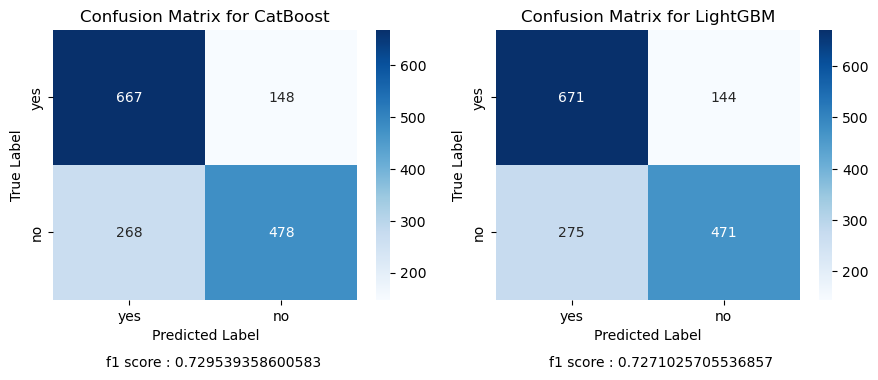

In [53]:
y_pred_catboost = best_catboost_model.predict(x_test)
y_pred_lightgbm = best_lightgbm_model.predict(x_test)

catboost_f1_score = f1_score(y_test, y_pred_catboost, average='macro')
lightgbm_f1_score = f1_score(y_test, y_pred_lightgbm, average='macro')

catboost_cm = confusion_matrix(y_test, y_pred_catboost)
lightgbm_cm = confusion_matrix(y_test, y_pred_lightgbm)

class_names = ['yes', 'no']

fig, axes = plt.subplots(1, 2, figsize=(9, 4))

sns.heatmap(catboost_cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names, ax=axes[0])
axes[0].set_title("Confusion Matrix for CatBoost")
axes[0].set_xlabel('Predicted Label')
axes[0].set_ylabel('True Label')
axes[0].text(0.35, 2.5,f'f1 score : {catboost_f1_score}')

sns.heatmap(lightgbm_cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names, ax=axes[1])
axes[1].set_title("Confusion Matrix for LightGBM")
axes[1].set_xlabel('Predicted Label')
axes[1].set_ylabel('True Label')
axes[1].text(0.35, 2.5,f'f1 score : {lightgbm_f1_score}')

plt.tight_layout()
plt.show()


Based on the evaluation of model performance using the F1 score on the test data:

- **CatBoost**: Achieved an F1 score of 0.7295.

- **LightGBM**: Achieved an F1 score of 0.7271.

These results suggest that the CatBoost model outperforms the LightGBM model on this dataset.


In [56]:
catboost_model = best_catboost_model.named_steps['classifier']
joblib.dump(catboost_model, 'best_catboost_model.cbm')

['best_catboost_model.cbm']

The tuned catboost model is saved for future use.

# I. Conclusion and Recomendation

**Conclusion**
- the CatBoost model stands out as the top performer in predicting whether a customer will opt to open a deposit account, achieving an impressive f1 score of 0.7295.
- Assuming that the data test is real new data, utilizing this model, we can potentially avoid wasting resource by targeting 478 customers in the campaign as they are won’t opt for opening a deposit account and more focused on 667 customer who will opt for opening a deposit account.


**Reccomendation**

- the model's f1 score could be improved by gaining more feauture, creating new feature from the available feature is recomended.
- The findings indicate potential underfitting of the model, thus employing a more complecx model is recommended.
- Hyperparameter tuning with more complex method could also improve f1 score.